In [6]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt 
from tqdm import tqdm

import sklearn
from sklearn.base import BaseEstimator 
from sklearn.base import RegressorMixin

from sklearn.model_selection import cross_val_score, train_test_split, learning_curve

from sklearn.metrics import accuracy_score

from sklearn.utils import shuffle

from ctypes import ArgumentError
import scipy

import torch

In [44]:
class RFF:
  def __init__(self, n_features, n_dim, kernel='gaussian', coeff=1.0, lengthscale=1.0):
    self.n_features = n_features
    self.n_dim = n_dim
    self.kernel = kernel
    self.coeff = coeff
    self.lengthscale = lengthscale

  def gen_features(self):
    omega_shape = (self.n_features, self.n_dim)
    if self.kernel == 'gaussian':
      self.omega = np.random.normal(0., 1., omega_shape)
    elif self.kernel == 'laplacian':
      self.omega = np.random.laplace(0., 1., omega_shape)
    elif self.kernel == 'cauchy':
      self.omega = np.ranodm.cauchy(0., 1., omega_shape)
    else:
      raise ArgumentError(f'Invalid kernel: {self.kernel}')

    self.omega /= self.lengthscale
    self.phi = np.random.uniform(0, 2*np.pi, (self.n_features))

  def encode_features(self, X):
    features = np.cos(np.einsum('sd, fd -> sf', X, self.omega) + self.phi)
    features = self.coeff * (2 / self.omega.shape[0]) ** 0.5 * features
    return features

  def get_n_features(self):
    return self.omega.shape[0]

In [45]:
class PolynomialFeatures:
  def __init__(self, degree=2):
    self.degree = degree

  def gen_features(self):
    pass

  def encode_features(self, X):
    features = np.empty((X.shape[0], self.degree + 1))
    for d in range(self.degree + 1):
      features[:, d] = np.power(X, d).reshape(-1)
    return features

  def get_n_features(self):
    return self.degree + 1

In [46]:
class DistributionEncoder:
  def __init__(self):
    self.distributions = None
    self.dist_samples = None
    self.mean_embeddings = None
    self.regressor = None

    self.samples_df = None

  def gen_distributions(self, num, mu_range, sigma_range, same_mu=False):
    self.distributions = np.empty((num, 2))
    self.distributions[:, 1] = np.random.uniform(sigma_range[0], sigma_range[1], num)
    if same_mu:
      self.distributions[:, 0] = np.random.uniform(mu_range[0], mu_range[1])
    else:
      self.distributions[:, 0] = np.random.uniform(mu_range[0], mu_range[1], num)

  def gen_distributions_grid(self, num, mu_range, mu_num, sigma_range, sigma_num):
    mu_freq = (mu_range[1] - mu_range[0]) / mu_num
    sigma_freq = (sigma_range[1] - sigma_range[0]) / sigma_num
    self.grid_xx, self.grid_yy = np.mgrid[mu_range[0]:mu_range[1]:mu_freq, sigma_range[0]:sigma_range[1]:sigma_freq]
    xx_flat = self.grid_xx.reshape(-1)
    yy_flat = self.grid_yy.reshape(-1)
    self.distributions = np.array(list(zip(xx_flat, yy_flat)))

  def gen_dist_samples(self, n_samples_mean, n_samples_var, n_samples_min=5000):
    self.dist_samples = {}
    for i, [mu, sigma] in enumerate(self.distributions):
      n_samples = max(n_samples_min, int(np.random.normal(n_samples_mean, n_samples_var)))
      self.dist_samples[i] = np.random.normal(mu, sigma, size=(n_samples, 1))

  def setup_encoder(self, kernel_encoder):
    self.kernel_encoder = kernel_encoder

  def mean_embedding(self):
    n_distributions = self.distributions.shape[0]
    n_features = self.kernel_encoder.get_n_features()
    
    self.mean_embeddings = np.empty((n_distributions, n_features))
    for idx, samples in self.dist_samples.items():
      features = self.kernel_encoder.encode_features(samples)
      self.mean_embeddings[idx] = np.mean(features, axis=0)

  def plot_distributions(self):
    self.distributions_df = pd.DataFrame(self.distributions, columns = ['mu','sigma'])
    sns.scatterplot(data=self.distributions_df, x='mu', y='sigma')

  def plot_dist_samples(self, refresh=False):
    if not refresh and self.samples_df is not None:
      sns.scatterplot(data=self.samples_df, x='distribution', y='value')
    flat_samples = []
    for idx, samples in self.dist_samples.items():
      samples_with_index = np.concatenate([samples, np.full((samples.shape[0], 1), idx, float)], axis=1)
      flat_samples.extend(samples_with_index)
    self.samples_df = pd.DataFrame(flat_samples, columns = ['value', 'distribution'])
    self.samples_df['distribution'] = self.samples_df['distribution'].astype(int)
    sns.scatterplot(data=self.samples_df, x='distribution', y='value')


In [47]:
class Adam:
  def __init__(self, lr=.01,
               _lambda=0.1,
               betas=(0.99, 0.999),
               eps=1e-08):
    self.lr = lr
    self.betas = betas
    self.eps = eps
    self._lambda = _lambda
    self.reset()

  def reset(self):
    self.i = 1
    self.m = 0
    self.v = 0

  def step(self, grad, theta):
      grad += self._lambda * theta
      beta1, beta2 = self.betas
      self.m = beta1 * self.m + (1 - beta1) * grad
      self.v = beta2 * self.v + (1- beta2) * (grad ** 2)
      m_hat = self.m / (1 - beta1 ** self.i)
      v_hat = self.v / (1 - beta2 ** self.i)
      update = self.lr * m_hat * (np.sqrt(v_hat) + self.eps)
      return update

## Logistic Regressor

In [48]:
def sigmoid(x):
  return scipy.special.expit(x)


class LogisticRegressor(BaseEstimator, RegressorMixin):
  def __init__(self, optimiser, epochs=1):
    self.epochs = epochs
    self.theta = None
    self.thetas_df = []

    self.optimiser = optimiser

  def loss(self, X, y, theta, _lambda=0.):
    y_hats = sigmoid(X @ theta)
    loss = 0
    for idx in range(y_hats.shape[0]):
      loss -= y[idx] * np.log(y_hats[idx]) + (1 - y[idx]) * np.log(1 - y_hats[idx])
    loss /= y_hats.shape[0]
    #loss += _lambda/2 * norm(theta) ** 2
    return loss

  def fit(self, X, y, plot=True):
    n_samples = X.shape[0]
    self.theta = np.random.uniform(size=X.shape[1])

    self.thetas = []

    self.thetas.append(self.theta.copy())
    self.optimiser.reset()
    for _ in range(self.epochs):
      for i, x in enumerate(X):
        grad = -(y[i] - sigmoid(self.theta @ x)) * x
        step = self.optimiser.step(grad, self.theta)
        self.theta -= step
      self.thetas.append(self.theta.copy())
    if plot:
      self.plot_loss(X, y)

  def predict(self, X, y_ground=None):
    pred = sigmoid(X @ self.theta)

    y_pred_bin = pred >= 0.5
    y_pred_bin = y_pred_bin.astype(int)
    return y_pred_bin

  def plot_learning(self):
    thetas_df = pd.DataFrame(self.thetas_df)
    sns.lineplot(data=thetas_df)

  def plot_loss(self, X, y):
    losses = []
    _lambda = self.optimiser._lambda
    for theta in self.thetas:
      losses.append(self.loss(X, y, theta, _lambda))
    df = pd.DataFrame(losses)
    sns.lineplot(data=losses)
    plt.show()

  def pred_score(self, y_pred, y_ground):
    y_pred_bin = y_pred >= 0.5
    y_pred_bin = y_pred_bin.astype(float)
    score = np.sum((np.equal(y_pred_bin, y_ground)))
    return score / y_pred.shape[0]

## Define constants

In [78]:
# N - no of distributions
N_DISTRIBUTIONS = 1000
SAME_MEAN = False

# Sn - no of samples generated by each distributions
# Coming from a Normal(N_SAMPLES_PER_DIST_MU, N_SAMPLES_PER_DIST_SIGMA)
N_SAMPLES_PER_DIST_MU = 7000.
N_SAMPLES_PER_DIST_SIGMA = 500.
MIN_SAMPLES = 5000

# T threshold for distribution classification
T_threshold = 2.3

N_FEATURES = 4

MU_RANGE = (0, 10)
SIGMA_RANGE = (0, 5)

In [79]:
dist_encoder = DistributionEncoder()

In [80]:
dist_encoder.gen_distributions(N_DISTRIBUTIONS, MU_RANGE, SIGMA_RANGE)

In [82]:
dist_encoder.gen_dist_samples(N_SAMPLES_PER_DIST_MU, N_SAMPLES_PER_DIST_SIGMA)

In [83]:
n_features = 20
feature_encoder = RFF(n_features, 1, kernel='gaussian', coeff=1.0, lengthscale=1.0)
feature_encoder.gen_features()
dist_encoder.setup_encoder(feature_encoder)
dist_encoder.mean_embedding()

In [91]:
n_features = 200
feature_encoder = RFF(n_features, 1, kernel='gaussian', params=[1.0, 1.5])
feature_encoder.gen_features()
dist_encoder.setup_encoder(feature_encoder)
dist_encoder.mean_embedding()

TypeError: RFF.__init__() got an unexpected keyword argument 'params'

In [ ]:
plot_dist_encoder.setup_encoder(feature_encoder)
plot_dist_encoder.mean_embedding()

In [ ]:
model = LR(random_state=3, tol=1e-6, max_iter=200)
#optimiser = Adam(_lambda=0., lr=0.003)
#model = LogisticRegressor(optimiser, epochs=400)
#train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(model, X_train, y_train, cv=4,return_times=True, scoring='accuracy')

model.fit(X_train, y_train)
#print(f'Test set score: {np.mean(test_scores)}')

plot_x = plot_dist_encoder.mean_embeddings
plot_y = model.predict(plot_x)

plot_labels = (plot_dist_encoder.distributions[:, 1] > T_threshold).astype(float)
print(f'Grid score: {accuracy_score(plot_labels, plot_y)}')

In [ ]:
  plot_y_grid = plot_y.reshape(xx.shape[0], -1)
  df = pd.DataFrame(dist_encoder.distributions, columns=['mu', 'sigma'])
  label = df['sigma'] > T_threshold
  df['label'] = label.astype(int)
  f, ax = plt.subplots(1, 1)
  plt.title(f'C={c}')
  cs = ax.contourf(xx, yy, plot_y_grid, cmap='cool')
  f.colorbar(cs)
  sns.scatterplot(ax=ax, data=df, x='mu', y='sigma', hue='label')
  ax.legend(frameon=True, framealpha=0.9).set_zorder(5)
  f.show()

Grid score: 0.8182503770739065


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


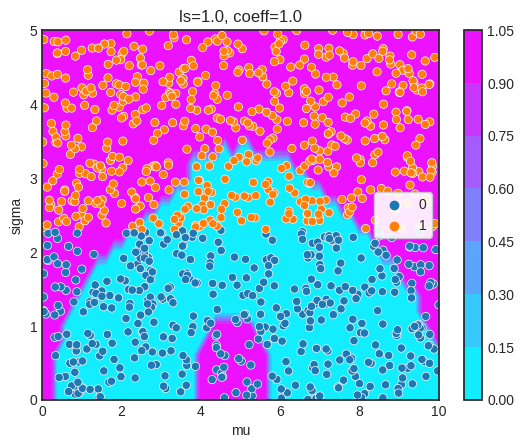

Grid score: 0.797134238310709


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


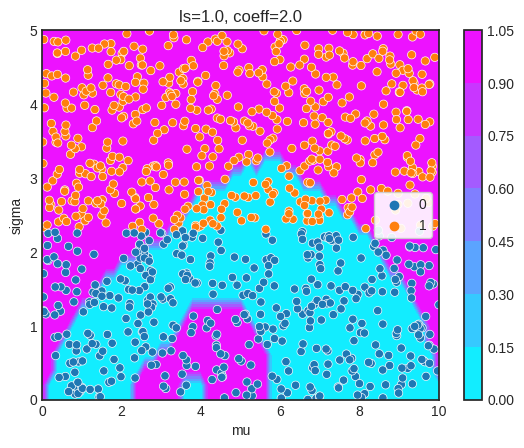

Grid score: 0.8589743589743589


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


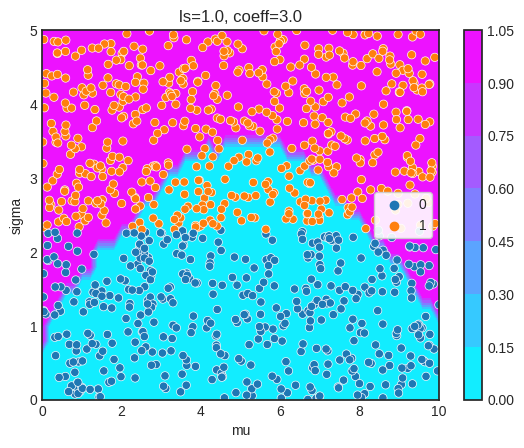

Grid score: 0.8597285067873304


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


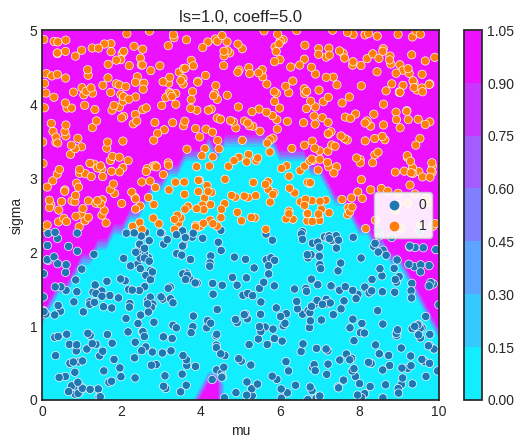

Grid score: 0.8740573152337858


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


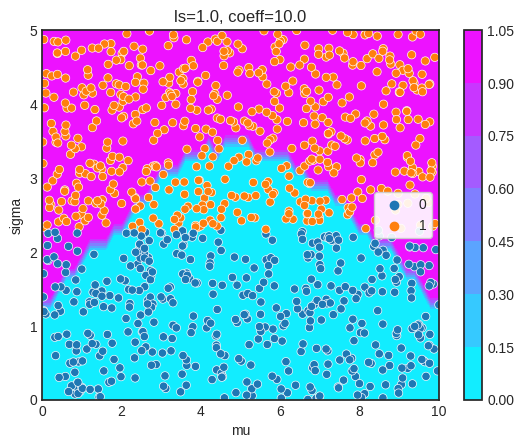

/usr/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


Grid score: 0.8800904977375565


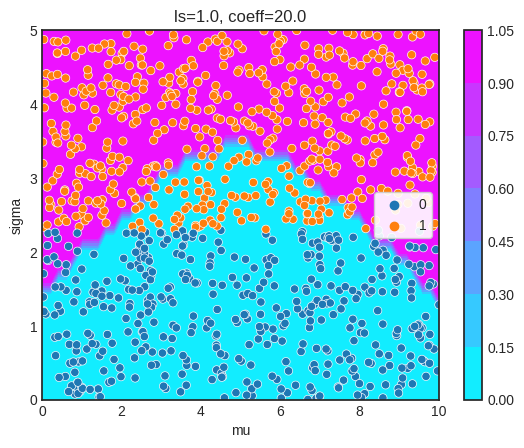

/usr/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


Grid score: 0.8959276018099548


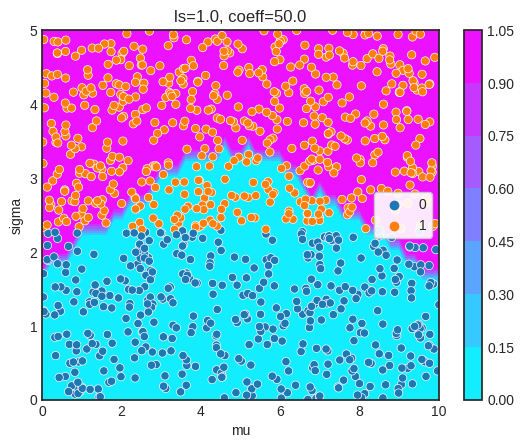

Grid score: 0.755656108597285


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


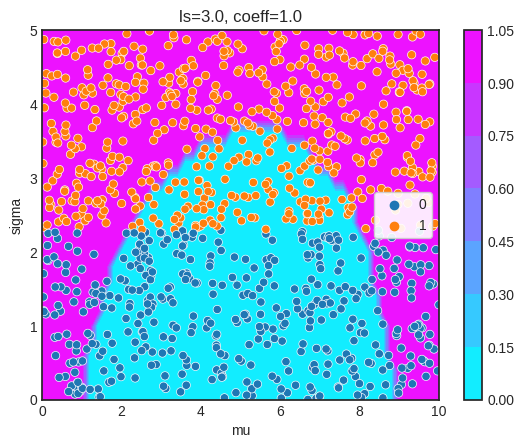

Grid score: 0.8129713423831071


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


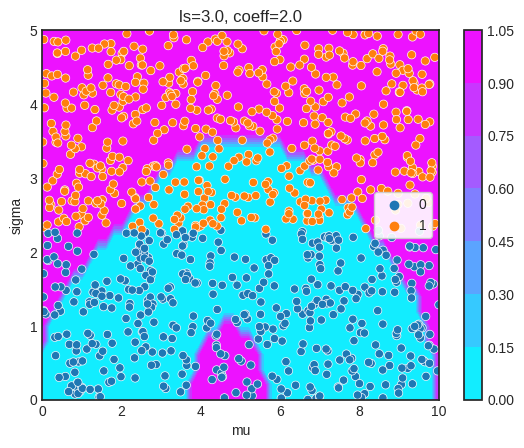

Grid score: 0.8559577677224736


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


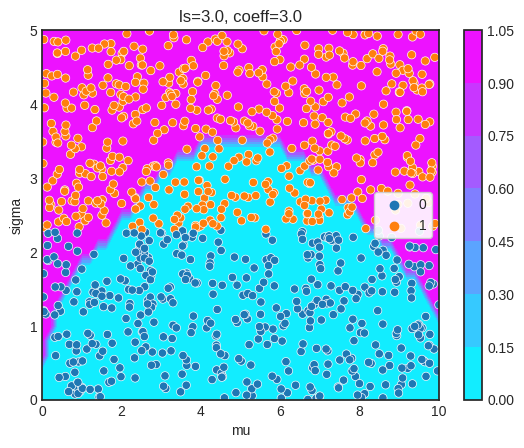

Grid score: 0.8250377073906485


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


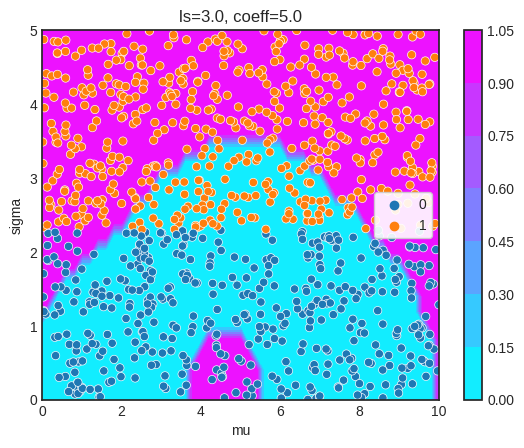

Grid score: 0.8318250377073907


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


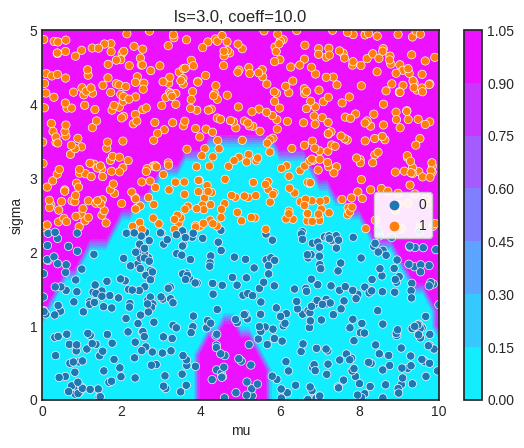

Grid score: 0.8416289592760181


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


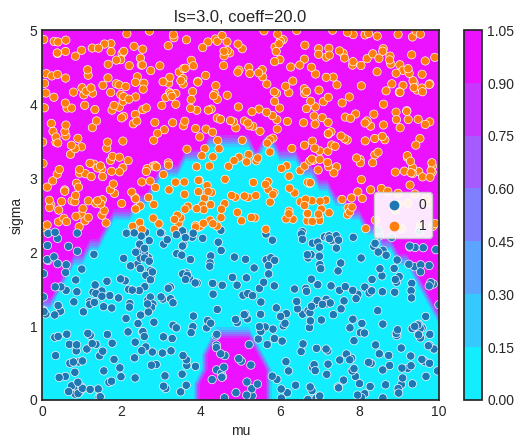

/usr/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


Grid score: 0.8604826546003017


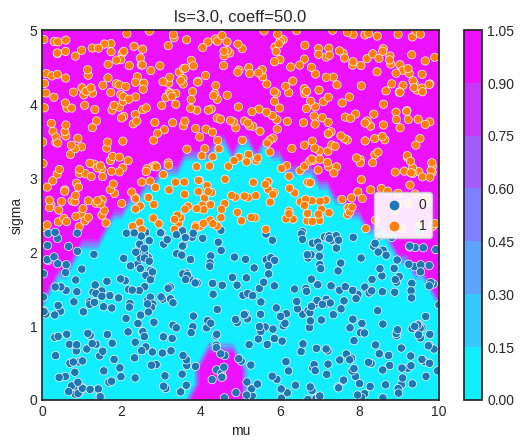

Grid score: 0.7413273001508296


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


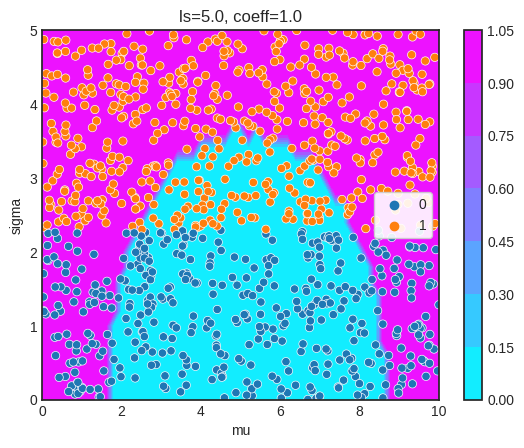

Grid score: 0.7337858220211161


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


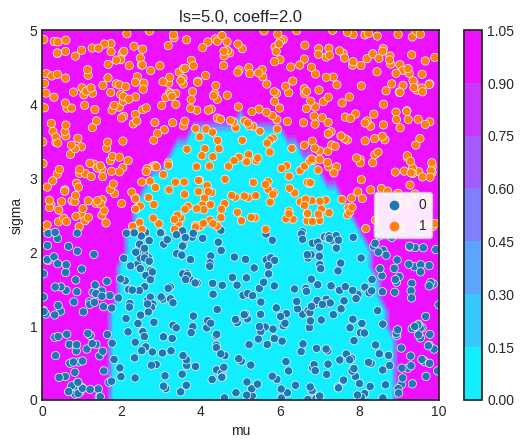

Grid score: 0.7435897435897436


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


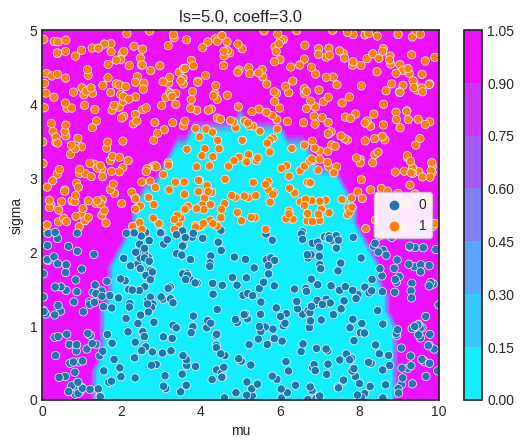

Grid score: 0.8340874811463047


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


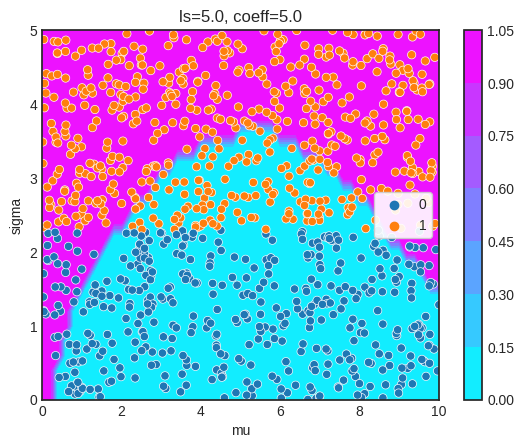

Grid score: 0.8521870286576169


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


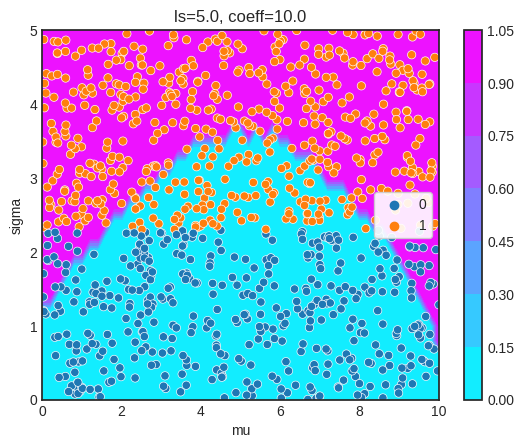

Grid score: 0.8574660633484162


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


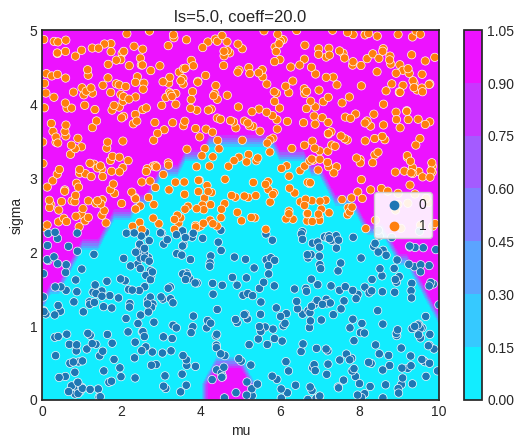

Grid score: 0.8680241327300151


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


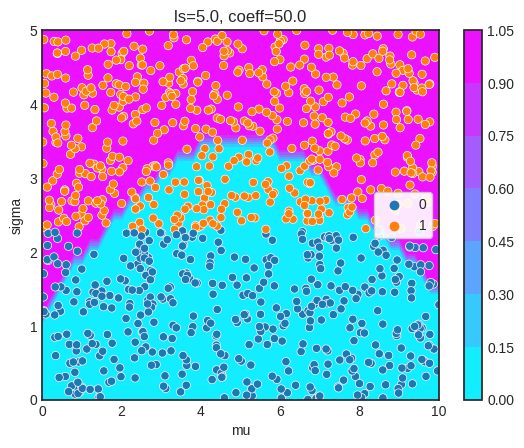

Grid score: 0.7300150829562594


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


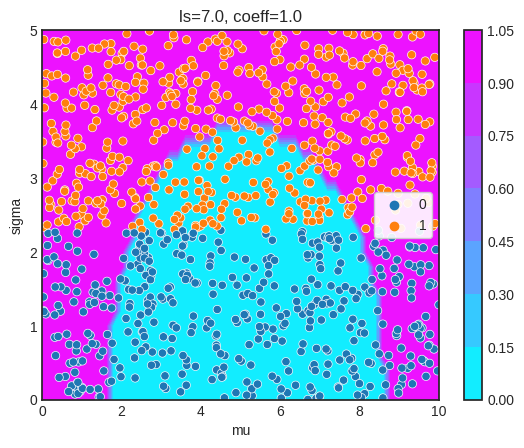

Grid score: 0.7345399698340875


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


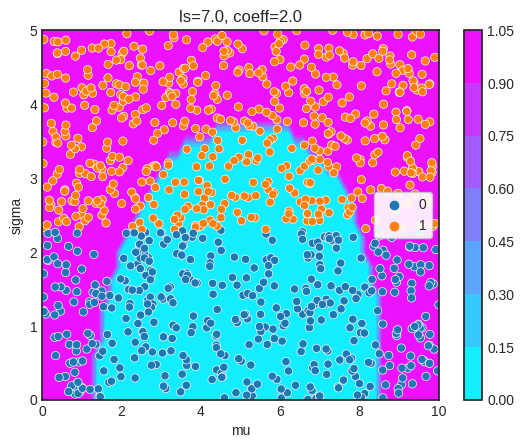

Grid score: 0.7360482654600302


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


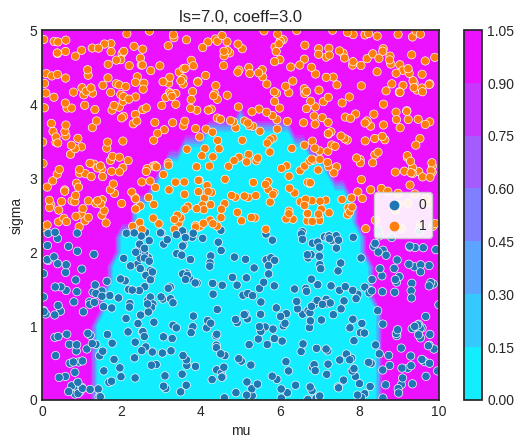

Grid score: 0.7360482654600302


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


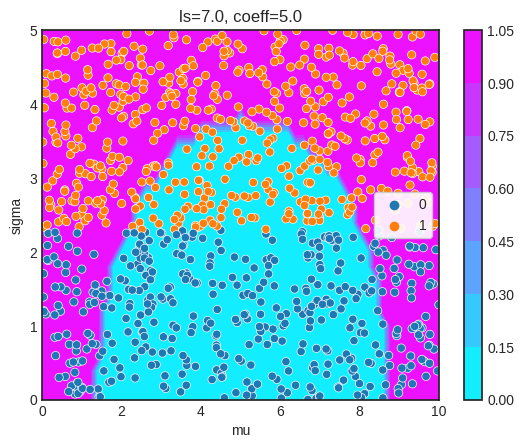

Grid score: 0.7963800904977375


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


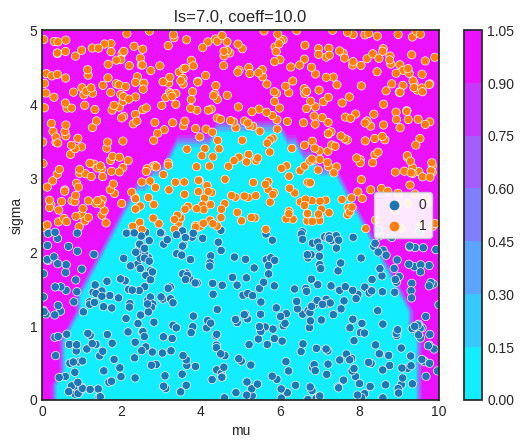

Grid score: 0.8491704374057315


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


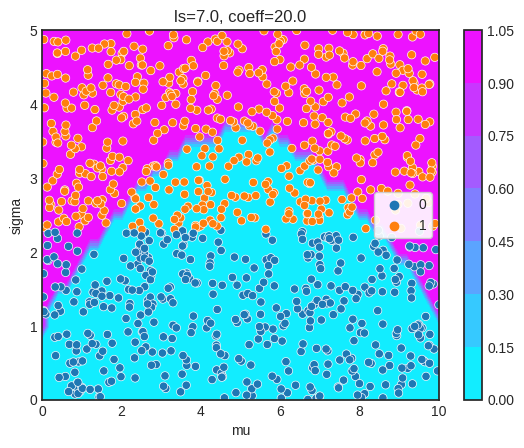

Grid score: 0.8544494720965309


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


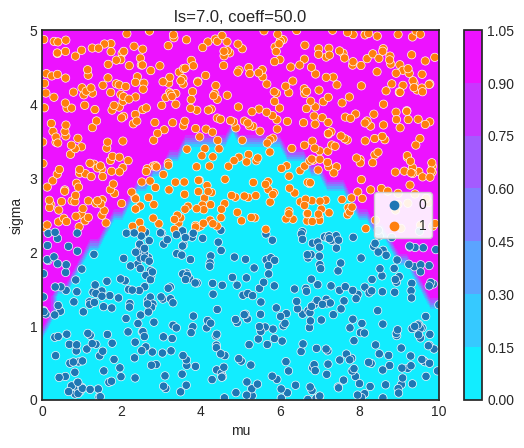

Grid score: 0.7330316742081447


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


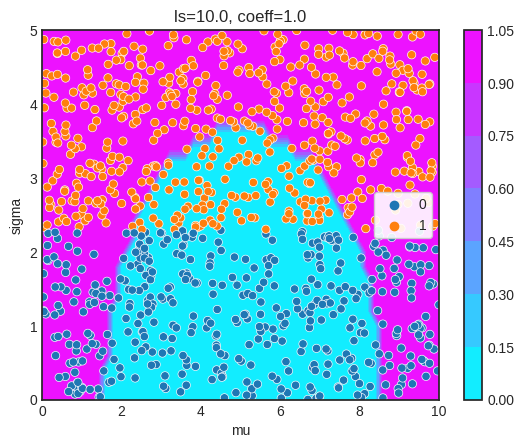

Grid score: 0.7428355957767723


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


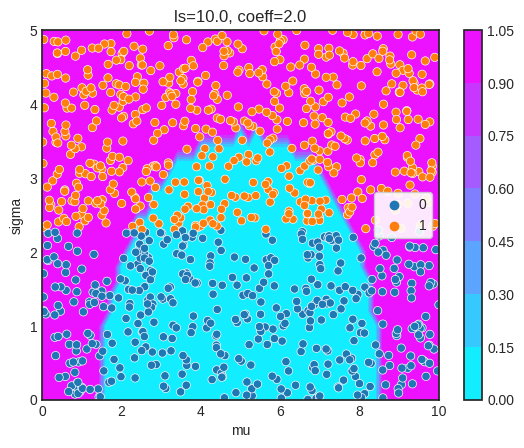

Grid score: 0.7420814479638009


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


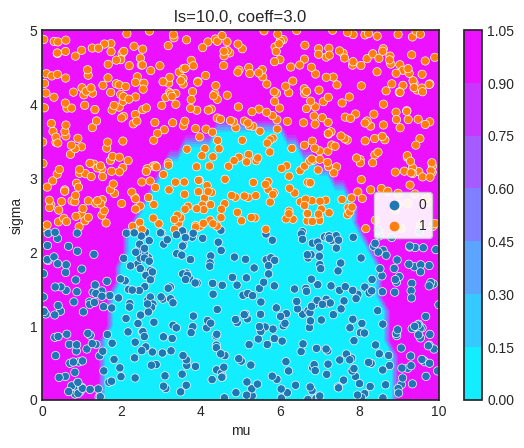

Grid score: 0.7375565610859729


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


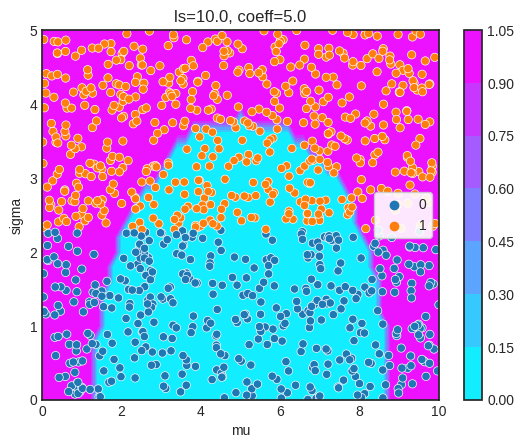

Grid score: 0.7420814479638009


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


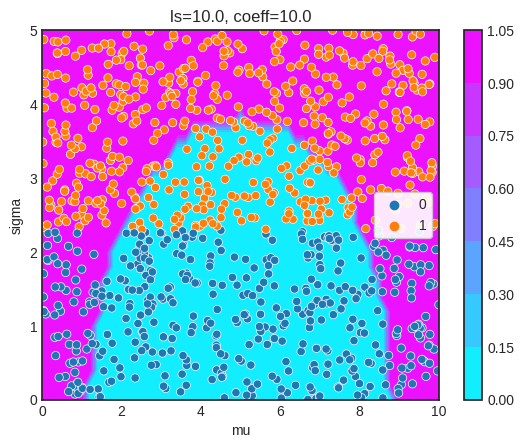

Grid score: 0.7601809954751131


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


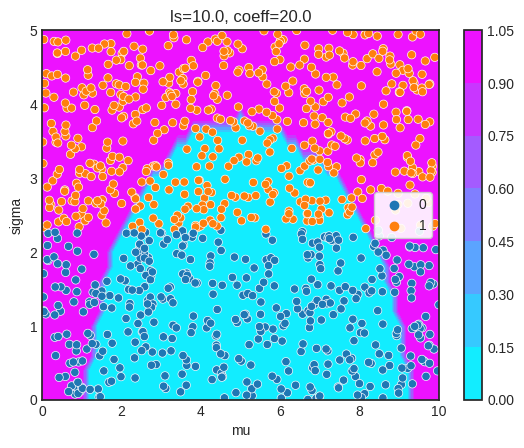

Grid score: 0.748868778280543


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


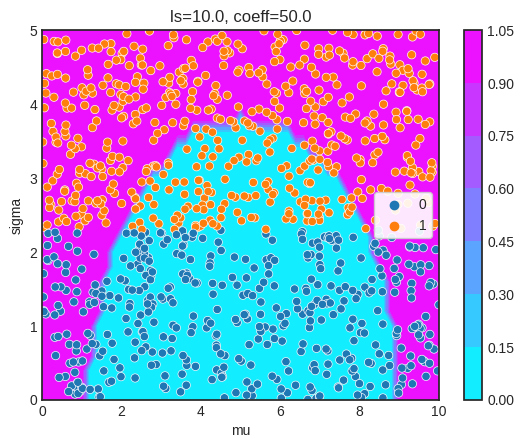

Grid score: 0.6365007541478129


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


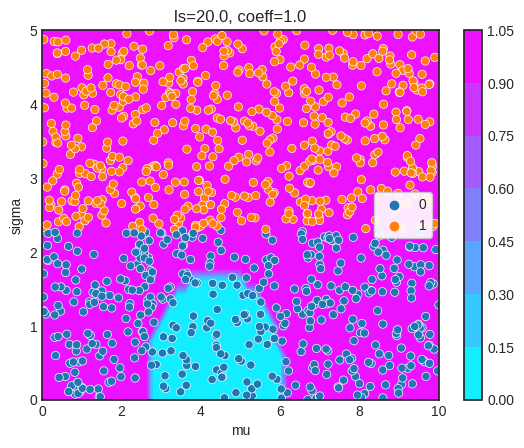

Grid score: 0.7496229260935143


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


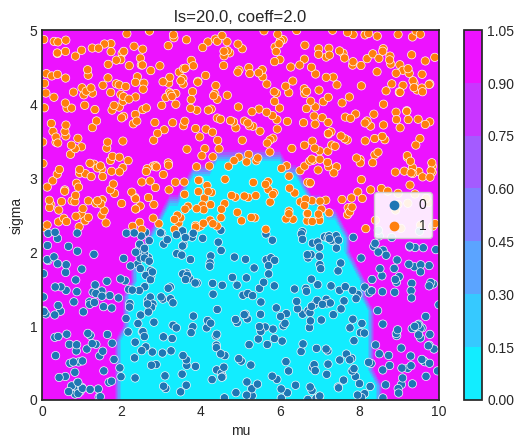

Grid score: 0.746606334841629


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


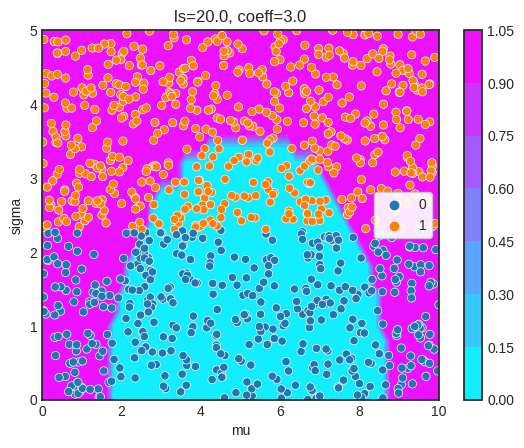

Grid score: 0.7450980392156863


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


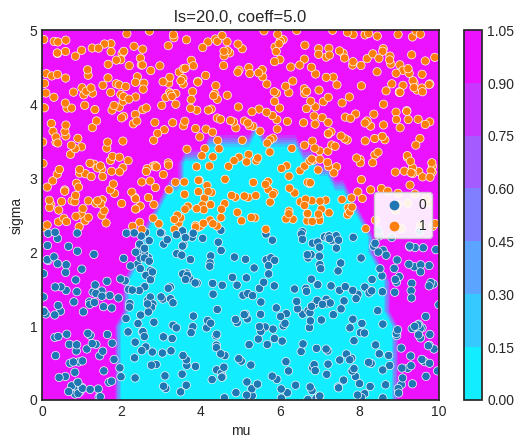

Grid score: 0.7420814479638009


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


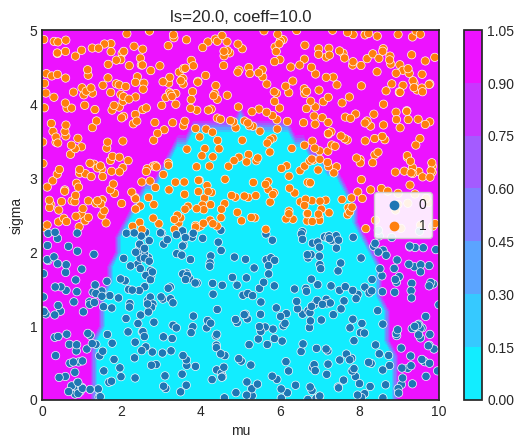

Grid score: 0.7413273001508296


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


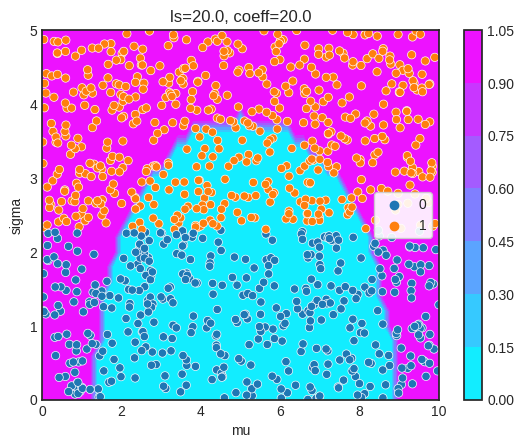

Grid score: 0.7420814479638009


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


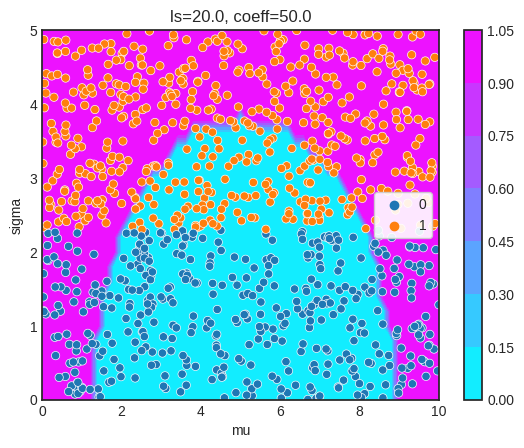

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


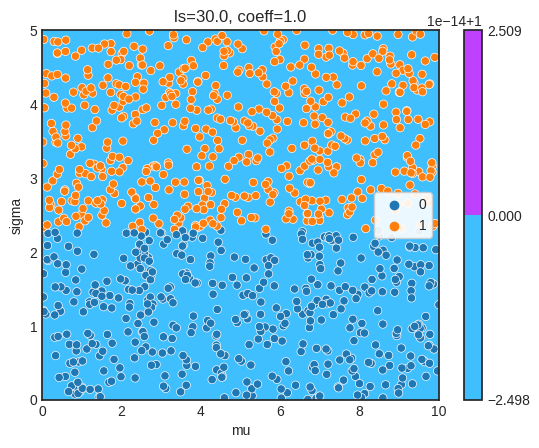

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


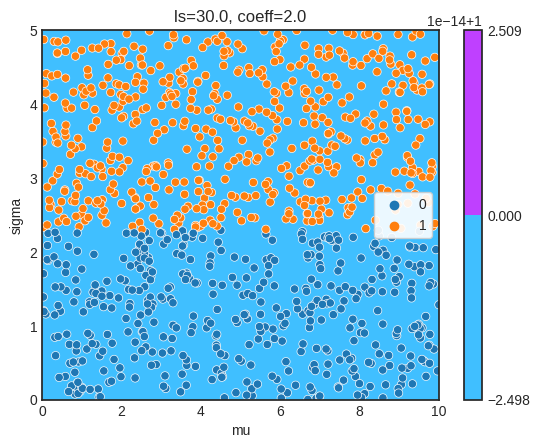

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


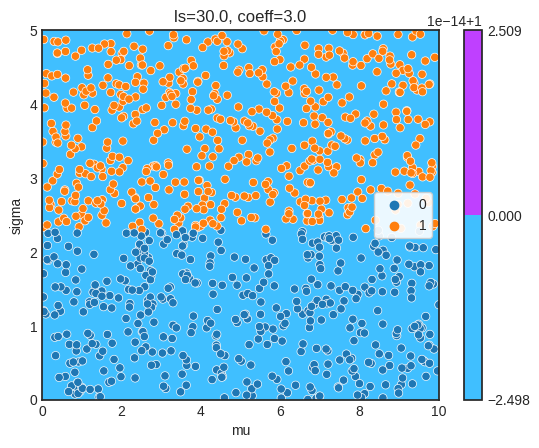

Grid score: 0.7413273001508296


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


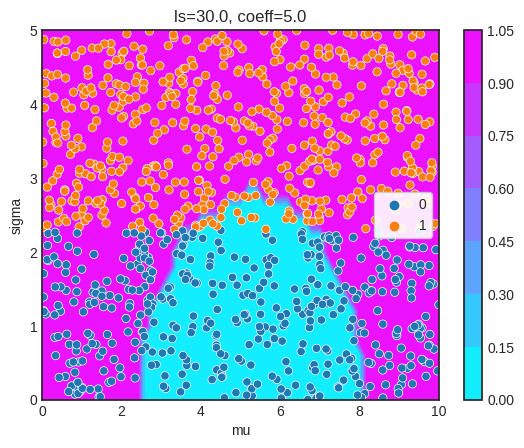

Grid score: 0.7428355957767723


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


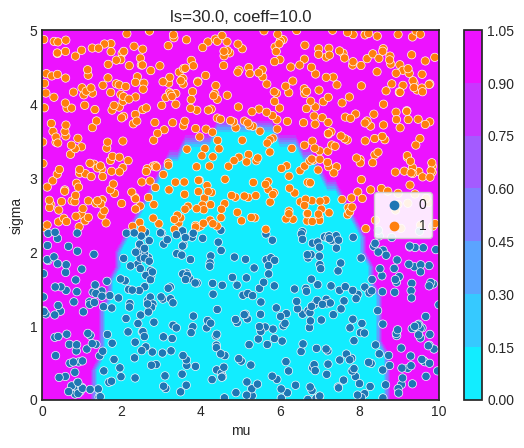

Grid score: 0.7428355957767723


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


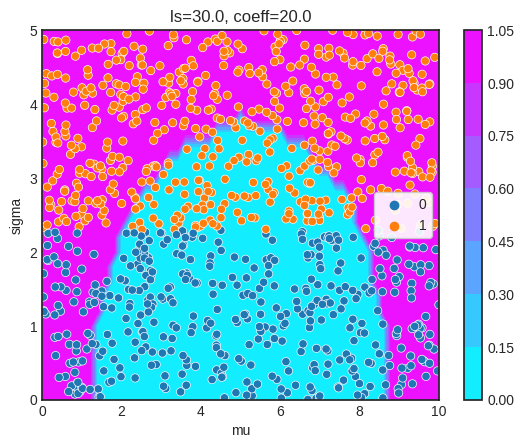

Grid score: 0.744343891402715


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


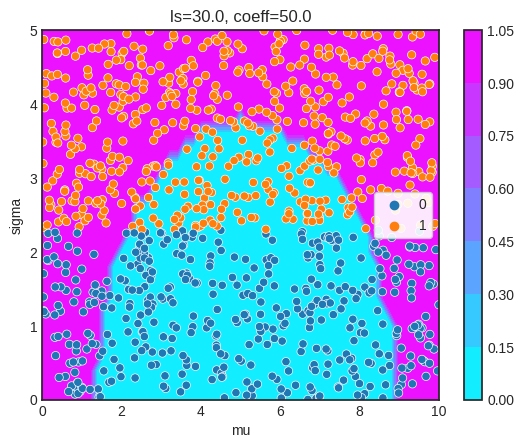

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


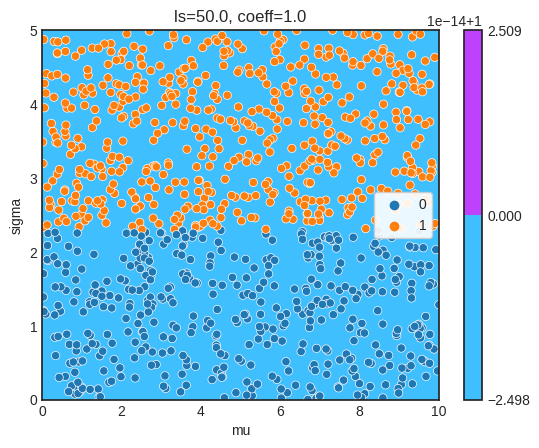

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


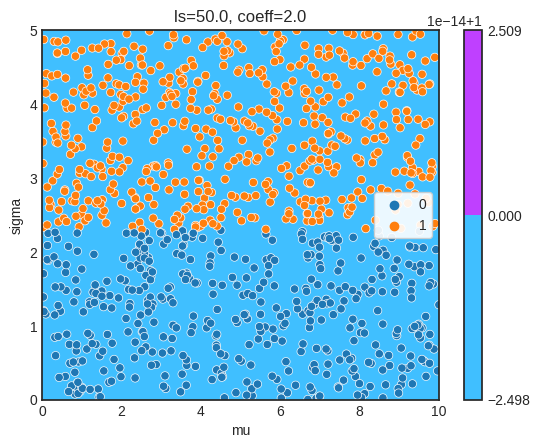

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


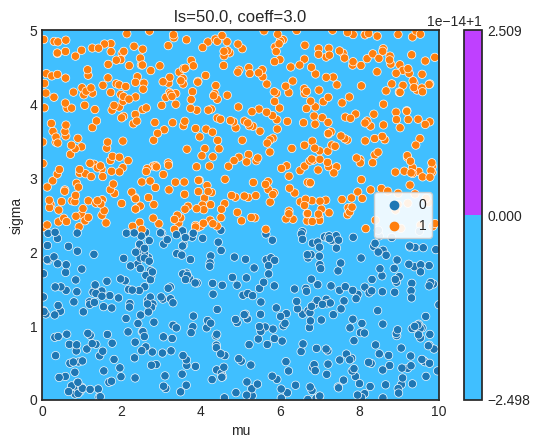

Grid score: 0.5384615384615384


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


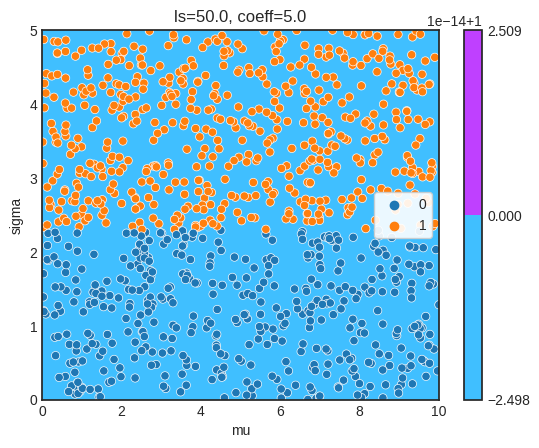

Grid score: 0.5648567119155354


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


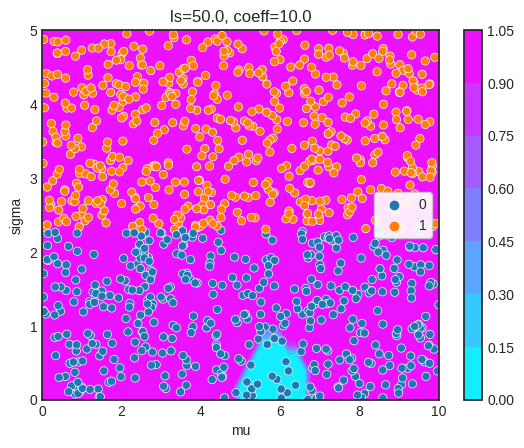

Grid score: 0.748868778280543


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


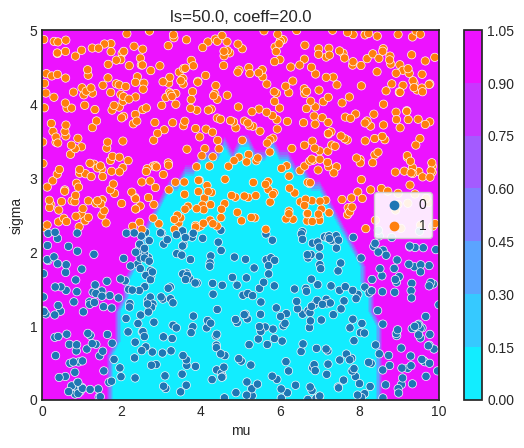

Grid score: 0.7420814479638009


/tmp/ipykernel_3346/963670901.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


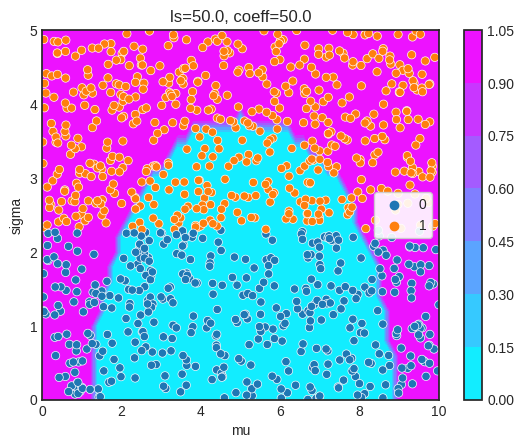

In [95]:
n_features = 25

for lengthscale in [1.0, 3.0, 5.0, 7.0, 10.0, 20.0, 30.0, 50.0]:
    for coeff in [1.0, 2.0, 3.0, 5.0, 10.0, 20.0, 50.0]:
        feature_encoder = RFF(n_features, 1, kernel='gaussian', coeff=coeff, lengthscale=lengthscale)
        feature_encoder.gen_features()
        dist_encoder.setup_encoder(feature_encoder)
        dist_encoder.mean_embedding()

        plot_dist_encoder.setup_encoder(feature_encoder)
        plot_dist_encoder.mean_embedding()

        y_full = dist_encoder.distributions[:, 1] > T_threshold
        y_full = y_full.astype(float)
        X_full = dist_encoder.mean_embeddings

        X_train, X_test, y_train, y_test = train_test_split(\
                X_full, y_full, test_size=0.20, random_state=45)

        model = LR(random_state=7, tol=1e-6, max_iter=200)
        model.fit(X_train, y_train)
    #     print(f'Test set score: {np.mean(test_scores)}')

        plot_x = plot_dist_encoder.mean_embeddings
        plot_y = model.predict(plot_x)

        plot_labels = (plot_dist_encoder.distributions[:, 1] > T_threshold).astype(float)
        print(f'Grid score: {accuracy_score(plot_labels, plot_y)}')

        plot_y_grid = plot_y.reshape(xx.shape[0], -1)
        df = pd.DataFrame(dist_encoder.distributions, columns=['mu', 'sigma'])
        label = df['sigma'] > T_threshold
        df['label'] = label.astype(int)
        f, ax = plt.subplots(1, 1)
        plt.title(f'ls={lengthscale}, coeff={coeff}')
        cs = ax.contourf(xx, yy, plot_y_grid, cmap='cool')
        f.colorbar(cs)
        sns.scatterplot(ax=ax, data=df, x='mu', y='sigma', hue='label')
        ax.legend(frameon=True, framealpha=0.9).set_zorder(5)
        f.show()
        plt.show()

In [87]:
plot_x = plot_dist_encoder.mean_embeddings
plot_y = model.predict(plot_x).reshape(-1, xx.shape[0])

In [88]:
# for degree in [3, 5, 10, 15, 20, 30, 50]:
#   encoder = PolynomialFeatures(degree)
#   #encoder = RFF(15, 1, kernel='gaussian')
#   dist_encoder.setup_encoder(encoder)
#   dist_encoder.mean_embedding()
#   dist_encoder.train_test_split(T_threshold)
#   X_train = dist_encoder.X_train
#   y_train = dist_encoder.y_train
#   X_test = dist_encoder.X_test
#   y_test = dist_encoder.y_test

#   optimiser = Adam(_lambda=0.2, lr=0.3)
#   model = LogisticRegressor(optimiser)
#   model.fit(X_train, y_train)
#   y_pred = model.predict(X_test)

#   print(f'{degree}: {np.sum((np.equal(y_pred, y_test)) / y_pred.shape[0])}')
#   pd.DataFrame(list(zip(y_pred, y_test)))

### Plots

In [89]:
#model.plot_distributions()

In [38]:
#model.plot_dist_samples()